<div>
<img src=https://www.institutedata.com/wp-content/uploads/2019/10/iod_h_tp_primary_c.svg width="300">
</div>

# Lab 5.1.1
# *Evaluating Classification Models*

In this lab you will be practicing evaluating classification models (Logistic Regression in particular) on a "Breast Cancer" data.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.datasets import make_blobs
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import roc_curve, auc

### 1. Load Data

From UCI's Machine Learning Repository: https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic

Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image. n the 3-dimensional space is that described in: [K. P. Bennett and O. L. Mangasarian: "Robust Linear Programming Discrimination of Two Linearly Inseparable Sets", Optimization Methods and Software 1, 1992, 23-34].

This database is also available through the UW CS ftp server: ftp ftp.cs.wisc.edu cd math-prog/cpo-dataset/machine-learn/WDBC/


Attribute Information:

1) ID number 2) Diagnosis (M = malignant, B = benign) 3-32)

Ten real-valued features are computed for each cell nucleus:

    a) radius (mean of distances from center to points on the perimeter)
    b) texture (standard deviation of gray-scale values)
    c) perimeter
    d) area
    e) smoothness (local variation in radius lengths)
    f) compactness (perimeter^2 / area - 1.0)
    g) concavity (severity of concave portions of the contour)
    h) concave points (number of concave portions of the contour)
    i) symmetry
    j) fractal dimension ("coastline approximation" - 1)

The mean, standard error and "worst" or largest (mean of the three largest values) of these features were computed for each image, resulting in 30 features. For instance, field 3 is Mean Radius, field 13 is Radius SE, field 23 is Worst Radius.

All feature values are recoded with four significant digits.

Missing attribute values: none

Class distribution: 357 benign, 212 malignant

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
breast_cancer_csv = '../../DATA/breast-cancer-wisconsin-data.csv'

### 2. EDA

Explore dataset. Check for nulls. Make the target column binary.

In [4]:
df = pd.read_csv(breast_cancer_csv)

In [5]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [6]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [8]:
df.drop(labels='Unnamed: 32',axis= 1,inplace=True)

In [9]:
df['diagnosis'].value_counts(normalize=True)

diagnosis
B    0.627417
M    0.372583
Name: proportion, dtype: float64

In [10]:
diagnosis_map = {'B':0,'M':1}
df['diagnosis'] = df['diagnosis'].map(diagnosis_map)

In [11]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [12]:
df['diagnosis'].unique()

array([1, 0], dtype=int64)

In [13]:
cancer= df['diagnosis']
cancer

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64

In [ ]:
def

In [38]:
df.head(1)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.8,1001.0,0.1184,0.2776,0.3001,0.1471,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189


In [16]:
def plot_column_histograms(data,cols):
    num_columns = data.shape[10]
    fig, axes = plt.subplots(nrows = 1, ncols=num_columns,
    figsize=(15, 5))
    for i in range(num_columns):
        axes[i].hist(data[ : , i],bins = 30, color= 'skyblue')
        axes[i].set_title(f'column{i+1}')
        axes[i].set_xlabel('Value')
        axes[i].set_ylabel('Frequency')
        axes[i].gride(True)
        plt.tight_layout()
        plt.show()                           

In [18]:
plot_column_histograms(df,df.diagnosis )

IndexError: tuple index out of range

(array([357.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 212.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

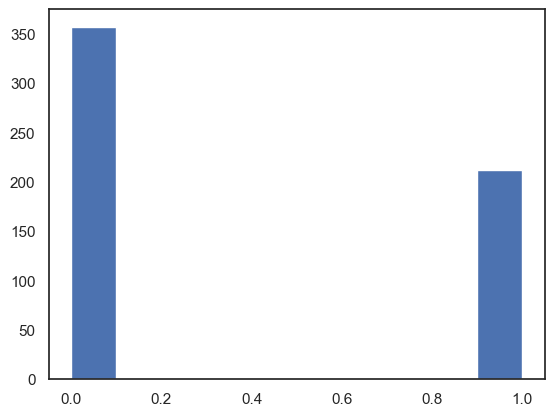

In [46]:
plt.hist(df['diagnosis'])

(array([ 19.,  79., 185., 129.,  55.,  50.,  38.,   7.,   4.,   3.]),
 array([ 6.981 ,  9.0939, 11.2068, 13.3197, 15.4326, 17.5455, 19.6584,
        21.7713, 23.8842, 25.9971, 28.11  ]),
 <BarContainer object of 10 artists>)

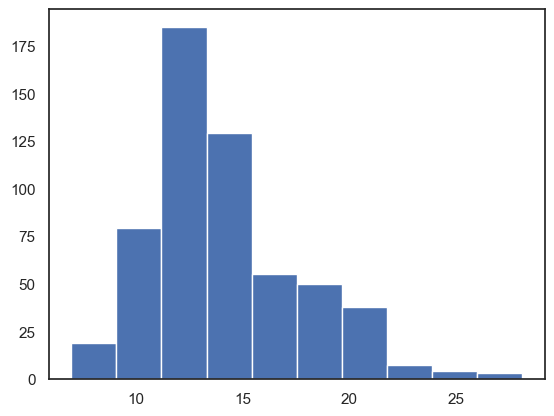

In [71]:
plt.hist(df['radius_mean'])

In [26]:
#sns.pairplot(df)
#plt.show()

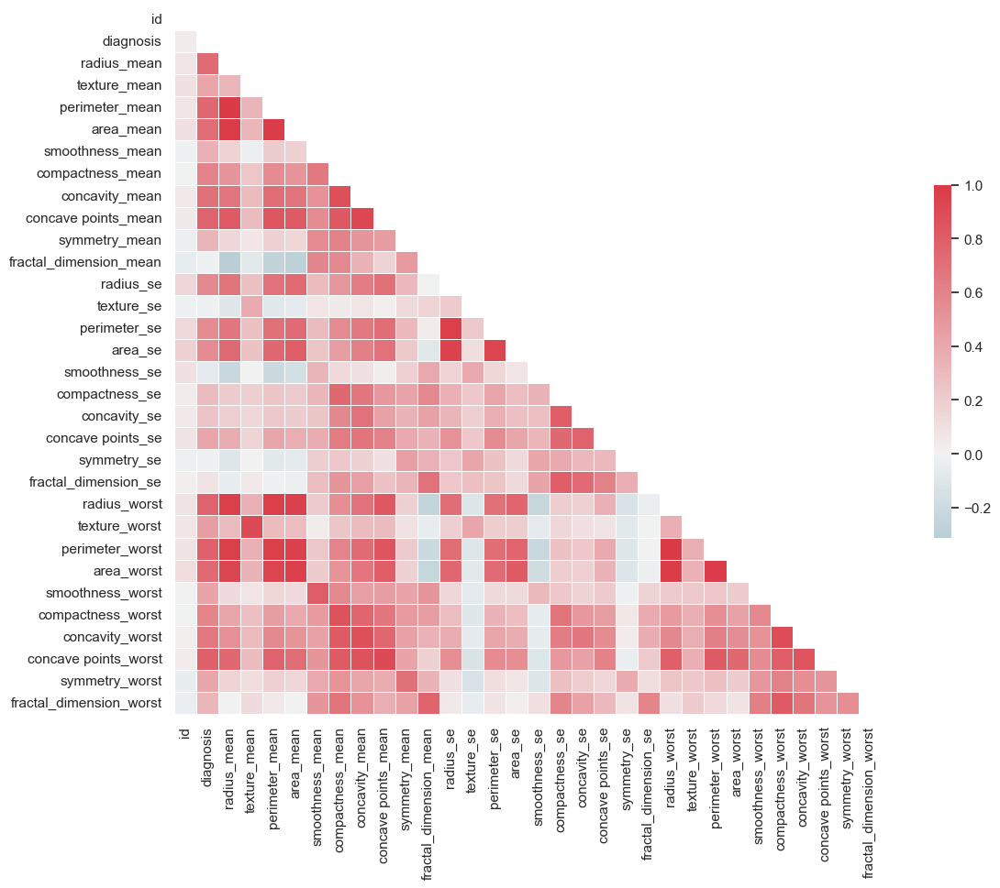

In [14]:
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(df.corr())
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 10))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show()

In [20]:
df.head(1)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.8,1001.0,0.1184,0.2776,0.3001,0.1471,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189


In [22]:
df['compactness_mean'].unique()

array([0.2776 , 0.07864, 0.1599 , 0.2839 , 0.1328 , 0.17   , 0.109  ,
       0.1645 , 0.1932 , 0.2396 , 0.06669, 0.1292 , 0.2458 , 0.1002 ,
       0.2293 , 0.1595 , 0.072  , 0.2022 , 0.1027 , 0.08129, 0.127  ,
       0.06492, 0.2135 , 0.1022 , 0.1457 , 0.2276 , 0.1868 , 0.1066 ,
       0.1697 , 0.1157 , 0.1887 , 0.1516 , 0.1496 , 0.1719 , 0.1559 ,
       0.1336 , 0.1098 , 0.03766, 0.05131, 0.1255 , 0.06031, 0.1218 ,
       0.219  , 0.1436 , 0.1047 , 0.1686 , 0.05943, 0.1231 , 0.09092,
       0.07698, 0.04966, 0.06059, 0.04751, 0.1485 , 0.07081, 0.05473,
       0.1267 , 0.1365 , 0.03789, 0.05272, 0.08061, 0.08963, 0.2008 ,
       0.08751, 0.1262 , 0.1479 , 0.07773, 0.04701, 0.1413 , 0.05234,
       0.1029 , 0.1531 , 0.183  , 0.128  , 0.06829, 0.08424, 0.2146 ,
       0.3454 , 0.09546, 0.09362, 0.1535 , 0.2665 , 0.1791 , 0.07165,
       0.1053 , 0.09947, 0.1206 , 0.09445, 0.1339 , 0.08606, 0.1036 ,
       0.05055, 0.08165, 0.1553 , 0.1313 , 0.07057, 0.05301, 0.07525,
       0.1141 , 0.08

In [24]:
df[df['compactness_mean']==0.06]

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
471,9113816,0,12.04,28.14,76.85,449.9,0.08752,0.06,0.02367,0.02377,...,13.6,33.33,87.24,567.6,0.1041,0.09726,0.05524,0.05547,0.2404,0.06639


(array([ 68., 182., 133.,  87.,  48.,  26.,  15.,   5.,   4.,   1.]),
 array([0.01938 , 0.051982, 0.084584, 0.117186, 0.149788, 0.18239 ,
        0.214992, 0.247594, 0.280196, 0.312798, 0.3454  ]),
 <BarContainer object of 10 artists>)

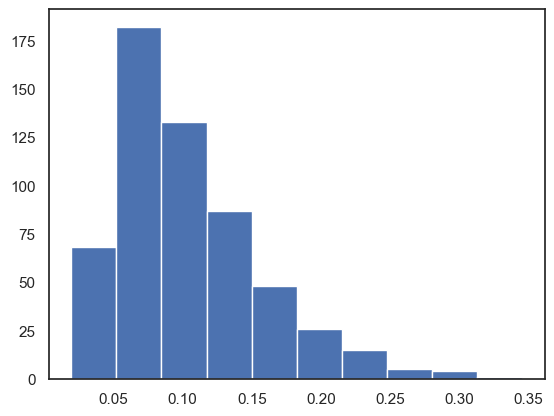

In [21]:
plt.hist(df['compactness_mean'])

(array([223., 193.,  58.,  51.,  25.,  10.,   4.,   4.,   0.,   1.]),
 array([ 185.2 ,  592.08,  998.96, 1405.84, 1812.72, 2219.6 , 2626.48,
        3033.36, 3440.24, 3847.12, 4254.  ]),
 <BarContainer object of 10 artists>)

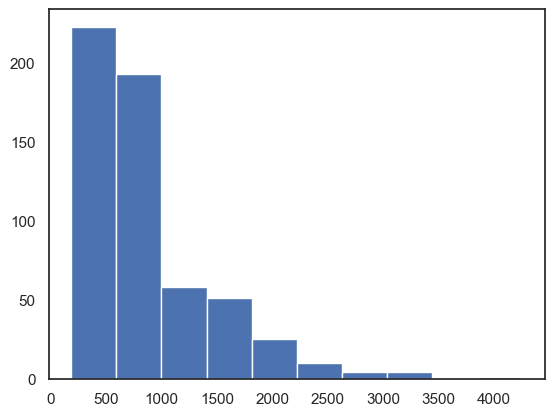

In [25]:
plt.hist(df['area_worst'])

{'whiskers': [<matplotlib.lines.Line2D at 0x1e1d3941bd0>,
 'caps': [<matplotlib.lines.Line2D at 0x1e1d3943290>,
 'boxes': [<matplotlib.lines.Line2D at 0x1e1d38c3050>],
 'medians': [<matplotlib.lines.Line2D at 0x1e1d396c750>],
 'fliers': [<matplotlib.lines.Line2D at 0x1e1d396cf90>],
 'means': []}

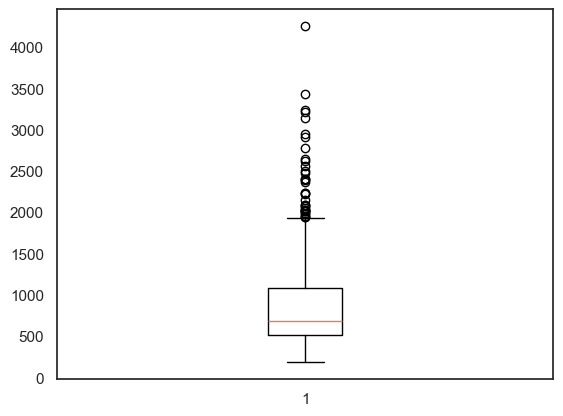

In [31]:
plt.boxplot(x='area_worst',data=df  )

In [27]:
df['area_worst'].unique()

array([2019. , 1956. , 1709. ,  567.7, 1575. ,  741.6, 1606. ,  897. ,
        739.3,  711.4, 1150. , 1299. , 1332. ,  876.5,  697.7,  943.2,
       1138. , 1315. , 2398. ,  711.2,  630.5,  314.9,  980.9, 2615. ,
       2215. , 1461. ,  896.9, 1403. , 1269. , 1227. , 1670. ,  888.7,
       1344. , 1813. , 1261. , 1229. ,  799.6,  545.9,  698.8,  740.4,
        787.9,  514. , 1651. ,  907.2,  740.7, 1567. ,  242.2,  759.4,
        582.6,  516.5,  656.7,  527.2, 1321. , 1030. ,  506.2, 2145. ,
        985.5,  624.1,  274.9,  368.6,  273.9,  959.5,  310.1,  888.3,
        925.1,  330.7,  466.7,  324.7,  554.9, 1866. ,  284.4, 1681. ,
        812.4,  611.1, 1223. ,  605.5, 1610. , 1623. ,  622.1,  525.1,
        614.9, 2562. , 1298. ,  567.9, 1603. ,  808.9,  574.7,  803.6,
        803.7,  830.9,  830.6,  699.4, 1025. , 1750. ,  495.2,  366.1,
        512.5,  826.4,  906.5,  185.2,  547.8,  361.2,  402.8,  827.2,
        521.7,  544.1, 2360. ,  518.1,  367. ,  527.4,  709. ,  374.4,
      

In [15]:
X = df.drop(columns=['diagnosis'])
y= df['diagnosis']

In [18]:
smote = SMOTE(random_state=42)
X_resampled, y_resampled =smote.fit_resample(X,y)
print(X_resampled)
print(y_resampled)

           id  radius_mean  texture_mean  perimeter_mean    area_mean  \
0      842302    17.990000     10.380000      122.800000  1001.000000   
1      842517    20.570000     17.770000      132.900000  1326.000000   
2    84300903    19.690000     21.250000      130.000000  1203.000000   
3    84348301    11.420000     20.380000       77.580000   386.100000   
4    84358402    20.290000     14.340000      135.100000  1297.000000   
..        ...          ...           ...             ...          ...   
709    886544    14.176003     17.831422       93.814926   624.140054   
710    856720    15.640118     19.525144      103.076417   778.249738   
711     89927    22.599174     24.026193      149.073831  1615.206306   
712     25610    15.021883     19.512373       98.277079   709.296841   
713    890453    14.158128     18.912384       90.572262   635.096631   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
0           0.118400          0.277600      

In [20]:
scaler = StandardScaler()
X_resampled_scaled = scaler.fit_transform(X_resampled)
print(X_resampled)

           id  radius_mean  texture_mean  perimeter_mean    area_mean  \
0      842302    17.990000     10.380000      122.800000  1001.000000   
1      842517    20.570000     17.770000      132.900000  1326.000000   
2    84300903    19.690000     21.250000      130.000000  1203.000000   
3    84348301    11.420000     20.380000       77.580000   386.100000   
4    84358402    20.290000     14.340000      135.100000  1297.000000   
..        ...          ...           ...             ...          ...   
709    886544    14.176003     17.831422       93.814926   624.140054   
710    856720    15.640118     19.525144      103.076417   778.249738   
711     89927    22.599174     24.026193      149.073831  1615.206306   
712     25610    15.021883     19.512373       98.277079   709.296841   
713    890453    14.158128     18.912384       90.572262   635.096631   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
0           0.118400          0.277600      

### 3. Logistic Regression Model

#### 3.1 Use Logistic Regression

Use Logistic Regression and examine accuracy score, confusion matrix, classification report for that model.

In [57]:
df.head(1)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.8,1001.0,0.1184,0.2776,0.3001,0.1471,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189


In [21]:
y_resampled.value_counts()

diagnosis
1    357
0    357
Name: count, dtype: int64

In [23]:
X = X_resampled[['area_worst','compactness_mean']]
y = y_resampled

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
logreg = LogisticRegression()
logreg.fit(X_train,y_train)
       

LogisticRegression()

#### 3.2 Calculate the predicted labels and predicted probabilities on the test set.

In [24]:
logreg_score = logreg.score(X_train,y_train)
logreg_score

0.9211908931698775

In [25]:
test_score = logreg.score(X_test,y_test)
test_score

0.9020979020979021

In [26]:
# predict test class:
y_pred = logreg.predict(X_test)
y_pred
# predicted test probability:

array([0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1], dtype=int64)

In [78]:
y_test.values

array([0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1], dtype=int64)

#### 3.3 Create the confusion matrix for your classifier's performance on the test set.

Convert confusion_matrix to a dataframe.

    columns=['predicted_healthy', 'predicted_cancer']
    index=['is_healthy', 'is_cancer']

In [27]:
# ANSWER
confusion_matrix(y_test,y_pred)

array([[65,  4],
       [10, 64]], dtype=int64)

In [28]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.87      0.94      0.90        69
           1       0.94      0.86      0.90        74

    accuracy                           0.90       143
   macro avg       0.90      0.90      0.90       143
weighted avg       0.91      0.90      0.90       143



#### 3.4 Calculate Accuracy

**Classification Accuracy:** Overall, how often is the classifier correct?

    (TP + TN) / float(TP + TN + FP + FN)

In [33]:
# ANSWER
print(metrics.accuracy_score(y_test,y_pred))
# use float to perform true division, not integer division

NameError: name 'metrics' is not defined

#### 3.5 Calculate Classification Error

**Classification Error:** Overall, how often is the classifier incorrect?

Also known as "Misclassification Rate"

    (FP + FN) / float(TP + TN + FP + FN)

In [ ]:
# ANSWER

#### 3.6 Calculate Sensitivity

**Sensitivity:** When the actual value is positive, how often is the prediction correct?

Something we want to maximize
How "sensitive" is the classifier to detecting positive instances?
- Also known as "True Positive Rate" or "Recall"
- TP / all positive
    - all positive = TP + FN

    sensitivity = TP / float(FN + TP)

In [ ]:
# ANSWER

#### 3.7 Calculate Specificity

**Specificity:** When the actual value is negative, how often is the prediction correct?

- Something we want to maximize. How "specific" (or "selective") is the classifier in predicting positive instances?
- TN / all negative
    - all negative = TN + FP

    specificity = TN / (TN + FP)

In [ ]:
# ANSWER

#### 3.8 Calculate False Positive Rate

**False Positive Rate:** When the actual value is negative, how often is the prediction incorrect?

    false_positive_rate = FP / float(TN + FP)

In [ ]:
# ANSWER

#### 3.9 Calculate Precision

**Precision:** When a positive value is predicted, how often is the prediction correct?

How "precise" is the classifier when predicting positive instances?

    precision = TP / float(TP + FP)

In [ ]:
# ANSWER

#### 3.10 Create a predicted test probability dataframe with column names 'class_0_pp','class_1_pp'

In [34]:
# ANSWER 
y_pp = pd.DataFrame(logreg.predict_proba(X_test),columns=['class_0_pp','class_1_pp'])
y_pp.head()

# Get the predicted probability vector and explicitly name the columns:)

,class_0_pp,class_1_pp
0,0.979292,0.020708
1,0.136760,0.863240
2,0.729174,0.270826
3,0.964695,0.035305
4,0.000003,0.999997


#### 3.11 The Receiver operating characteristic (ROC) curve

Plot the ROC curve for Class 1

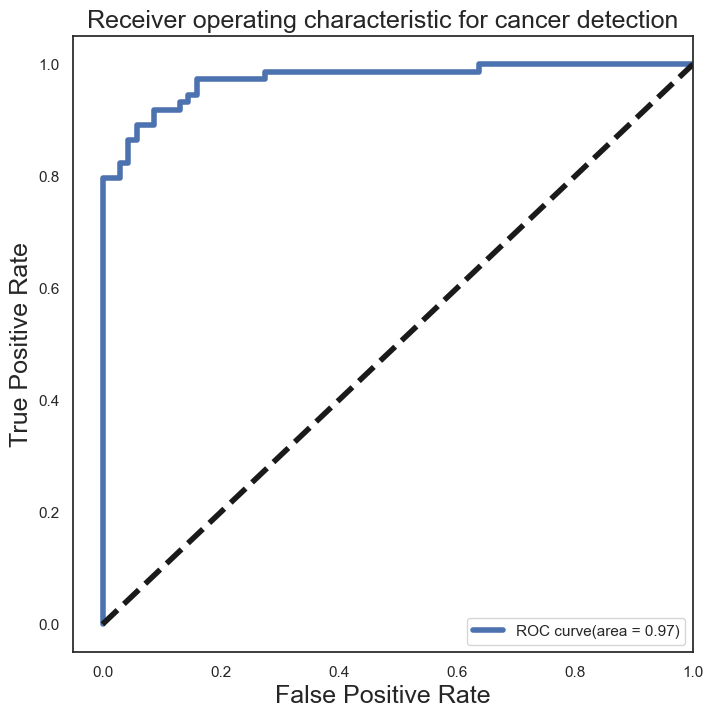

In [39]:
# For class 1, find the area under the curve
preds = logreg.predict_proba(X_test)[:,1]
# Find fpr, tpr
fpr, tpr, _ = roc_curve(y_test, y_pp['class_1_pp'])
# Find auc
roc_auc = auc(fpr, tpr)
# Plot of a ROC curve for class 1 (has_cancer)
plt.figure(figsize=[8,8])
plt.plot(fpr, tpr,label='ROC curve(area = %0.2f)'% roc_auc,linewidth=4)
# Plot fpr, tpr
plt.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.xlim([-0.05, 1.0])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate', fontsize=18)
plt.ylabel('True Positive Rate', fontsize=18)
plt.title('Receiver operating characteristic for cancer detection', fontsize=18)
plt.legend(loc="lower right")
plt.show()

**References**

[Breast Cancer Wisconsin (Diagnostic) Data Set](https://www.kaggle.com/uciml/breast-cancer-wisconsin-data/downloads/breast-cancer-wisconsin-data.zip/2)

[Validation curves: plotting scores to evaluate models](https://scikit-learn.org/stable/modules/learning_curve.html#learning-curves)



---



---



> > > > > > > > > © 2023 Institute of Data


---



---



